# RQ3: What topics appear about California wildfires in Bluesky posts and major newspaper headlines on January 9th?
---

The purpose of this notebook is to explore emergent themes about California wildfires for Bluesky posts and major newspaper headlines on January 9th.

Created by Natalie Castro
Affiliation: University of Colorado at Boulder

## 1. Environment Creation

### 1.1 Library Import

In [1]:
''' FILE ACCESS '''

import json
import os
import glob
import smart_open

''' DATA QUERYING '''

import regex as re
import pandas as pd
import datetime
from datetime import datetime
from dateutil.parser import parse

''' THEMATIC ANALYSIS '''
from bertopic import BERTopic
#from transformers import AutoModel


''' TEXT PREPROCESSING '''
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import sent_tokenize, word_tokenize
nltk.download('punkt')
nltk.download('stopwords')
stopwords = set(stopwords.words('english'))
import regex as re

''' DATA VISUALIZATION '''

from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
import seaborn as sb

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\natal\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\natal\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


## 2. Data Import

In [2]:
## Bluesky Posts
jan_ninth = pd.read_csv("Climate Posts January 9th.csv")

In [4]:
## News Headlines 
headlines = pd.read_excel("Climate Headlines - January 9th.xlsx")

In [6]:
## Dropping the unneeded index files
jan_ninth.drop(columns='Unnamed: 0',inplace=True)

headlines.drop(columns='Unnamed: 0',inplace=True)

### 2.1 Removing Numbers + Punctuation

In [46]:
def number_remover(text):
    new_text = re.sub("\d","",text)
    clean_text = re.sub("[.,?!#$%<>\-_]","",new_text)
    return (clean_text)

In [ ]:
number_remover('did you know that the earth was 8.5 million billion miles flat??1 wowwwie')
## a cheeky sample - NOT a real bluesky post!

'did you know that the earth was  million billion miles flat wowwwie'

In [47]:
jan_ninth['clean text'] = jan_ninth['text'].apply(lambda x: number_remover(x))
headlines['clean text'] = headlines['headline clean'].apply(lambda x: number_remover(x))

In [48]:
posts = jan_ninth['clean text'].to_list()
news = headlines['clean text'].to_list()

In [36]:
print (f"The total climate posts for January 9th is: {len(posts)}.\nThe total climate related news headlines is: {len(news)}")

The total climate posts for January 9th is: 27471.
The total climate related news headlines is: 131


## 3. Dictionary Analysis

### 3.1 Dictionary Definition

The core themes of our dictionaries for this analysis are as follows: climate change, science, policy mangagement, Republican, Democrat, current politics (centered around our data collection dates), and current moment

The dictionaries from this section were inspired by the work completed in Molder & Calice and Chinn et al.

In [16]:
climate_change = ["global warming","climate change","greenhouse gas","greenhouse gases"]
science = ["scientist","scientists","research","researchers","researching","researched",
           "professor","professors"]
policy_management = ["policy","legislation","FEMA","management","disaster respons",'government']

republican = ['republican','republicans','GOP','conservative','conservatives','MAGA']
democrat = ['democrat','democrats','liberal','liberals',"DNC"]

The dictionaries presented here were in relation specifically to windows of now

In [17]:
current_moment = ['resilience','just transition','climate justice','environmental justice',
                  'climate activism','climate anxiety','environmental racism','ecoside']

In [18]:
current_politics = ['insurrection','wildfires','inaguration']

In [91]:
word_counter = {"global warming":0,"climate change":0,"greenhouse gas":0,"greenhouse gases":0,
             "scientist":0,"scientists":0,"research":0,"researchers":0,"researching":0,"researched":0,
             "professor":0,"professors":0, "policy":0,"legislation":0,"FEMA":0,"management":0,"disaster respons":0,'government':0,
             'republican':0,'republicans':0,'GOP':0,'conservative':0,'conservatives':0,'MAGA':0,
             'democrat':0,'democrats':0,'liberal':0,'liberals':0,"DNC":0,
               'resilience':0,'just transition':0,'climate justice':0,'environmental justice':0,
                  'climate activism':0,'climate anxiety':0,'environmental racism':0,'ecoside':0,
               'insurrection':0,'wildfires':0,'inaguration':0}

climate_words = list(word_counter.keys())

In [115]:
dictionary_names = ["Climate Change","Science",'Policy','Republican','Democrat','Current Moment','Current Politics']
dictionary_list = [climate_change,science,policy_management,republican,democrat,current_moment,current_politics]

### 3.2 Word Counting

In [64]:
import re
from collections import defaultdict

def count_bigrams(post):
    # Split the post into words by spaces
    words = post.split(" ")

    # Create a defaultdict to count bigrams
    bigram_counter = defaultdict(int)

    # Iterate through the words to form bigrams
    for i in range(len(words) - 1):
        # Create bigrams by pairing consecutive words
        bigram = (words[i], words[i + 1])

        # Use regex to filter out non-alphabetical characters from the words in the bigram
        bigram = tuple(re.findall(r'\D+', word)[0] if re.findall(r'\D+', word) else word for word in bigram)
        bigram = ' '.join(bigram)
        
        if bigram in list(word_counter.keys()):
        # Count the bigram occurrences
            bigram_counter[bigram] += 1

    return dict(bigram_counter)


In [66]:
def post_reader(post): 
    word_counter =  {"global warming":0,"climate change":0,"greenhouse gas":0,"greenhouse gases":0,
             "scientist":0,"scientists":0,"research":0,"researchers":0,"researching":0,"researched":0,
             "professor":0,"professors":0, "policy":0,"legislation":0,"FEMA":0,"management":0,"disaster respons":0,'government':0,
             'republican':0,'republicans':0,'GOP':0,'conservative':0,'conservatives':0,'MAGA':0,
             'democrat':0,'democrats':0,'liberal':0,'liberals':0,"DNC":0,
               'resilience':0,'just transition':0,'climate justice':0,'environmental justice':0,
                  'climate activism':0,'climate anxiety':0,'environmental racism':0,'ecoside':0,
               'insurrection':0,'wildfires':0,'inaguration':0}

      ## Identifying each word by splitting the tweet on blank or white spaces.
    words = post.split(" ")

      ## Iterating through each word and filtering out actual alphabetical characters using Regex
    for word in words:
        matches = re.findall('\D*',word)
        word = matches[0]
        if word in word_counter.keys():
            word_counter[word] = word_counter[word] + 1
        else:
            continue
            
            
    bigram_counts = count_bigrams(post)
    word_counter.update(bigram_counts)
            
    return(word_counter)

In [246]:
word_counts = {}
for post in posts:
    
    ## Reading the posts
    current_count = post_reader(post)
    
    # Saving the psots to a dictionary
    word_counts[post] = current_count

In [247]:
total_word_counts = pd.DataFrame(word_counts).transpose()

In [249]:
post_word_counts = total_word_counts.sum()

In [250]:
post_word_counts

global warming            706
climate change           6537
greenhouse gas             94
greenhouse gases           34
scientist                 110
scientists                306
research                  200
researchers                46
researching                 9
researched                  3
professor                  11
professors                  3
policy                    266
legislation                44
FEMA                       24
management                141
disaster respons            0
government                309
republican                 12
republicans                42
GOP                        87
conservative               60
conservatives              36
MAGA                      158
democrat                    6
democrats                  45
liberal                    60
liberals                   35
DNC                         4
resilience                600
just transition             2
climate justice            40
environmental justice       3
climate ac

## 4. Topic Modeling

In [82]:
seed_topics = [climate_change,science,republican,democrat,policy_management,current_moment,current_politics]

In [83]:
from bertopic import BERTopic
from sklearn.feature_extraction.text import CountVectorizer

In [84]:
vectorizer_model = CountVectorizer(ngram_range=(1, 2), stop_words="english",decode_error='replace',strip_accents='ascii',
                                  lowercase=True)
topic_model = BERTopic(vectorizer_model=vectorizer_model,verbose=True,seed_topic_list=seed_topics)

In [ ]:
  ## Using model.fit_transform, to apply to the list of documents. This will both embedd and assign topics to the texts in the document lists.
topics, probs = topic_model.fit_transform(posts)

In [86]:
cleaned_topics = topic_model.reduce_outliers(posts, topics)

100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:09<00:00,  1.43it/s]


In [87]:
topic_model.update_topics(posts, topics=cleaned_topics)

2025-01-26 16:47:54,023 - BERTopic - WARNING: Using a custom list of topic assignments may lead to errors if topic reduction techniques are used afterwards. Make sure that manually assigning topics is the last step in the pipeline.Note that topic embeddings will also be created through weightedc-TF-IDF embeddings instead of centroid embeddings.


In [88]:
topic_info = topic_model.get_topic_info()

In [89]:
topic_info

,Topic,Count,Name,Representation,Representative_Docs
0,-1,30,-1_climatescam_nbaustraliainstituteorgauclimat...,"[climatescam, nbaustraliainstituteorgauclimate...",[How climate change impacts wildfires\n\nClima...
1,0,708,0_insurance_companies_risk_insurers,"[insurance, companies, risk, insurers, home, a...",[Ask insurance companies if climate change is ...
2,1,877,1_fossil_fuel_fuels_oil,"[fossil, fuel, fuels, oil, industry, burning, ...","[""How bad things get depends on how long we le..."
3,2,602,2_resilience_strength_mental_life,"[resilience, strength, mental, life, your, com...",[Why resilience wont solve the mental health c...
4,3,490,3_ai_data_use_using,"[ai, data, use, using, tech, centers, energy, ...",[Researchers believe that each string of promp...
...,...,...,...,...,...
285,284,21,284_answers_maga_number_endings,"[answers, maga, number, endings, easier, vile,...",[MAGA extremists are focused on blaming Dems f...
286,285,32,285_dioxide_wyoming_carbon_law,"[dioxide, wyoming, carbon, law, wyofilecommake...","[The stupid runs deep in Wyoming\n\n""It would ..."
287,286,55,286_planet_fine_saving_our,"[planet, fine, saving, our, we, will, destroyi...",[With all due respect:\n\nWere not losing our ...
288,287,18,287_percentage_vitamin_earthhigh_seating,"[percentage, vitamin, earthhigh, seating, teen...",[Fuck the GOP for their antiscience stance on ...


In [92]:
''' CREATING TOPICS FOR CLIMATE RELATED WORDS'''


semantic_topics_nested = []

for word in climate_words:

    related_tuple = topic_model.find_topics(search_term=word)

    related_topics = related_tuple[0]

    
    semantic_topics_nested.append(related_topics)

    
semantic_topics = sum(semantic_topics_nested, [])

In [99]:
climate_topics = topic_model.get_topics(semantic_topics,)

climate_topic_info = []

for topic in semantic_topics:
    current_info = topic_model.get_topic_info(topic)
    climate_topic_info.append(current_info)
    
climate_topics = pd.concat(climate_topic_info)

semantic_topics_nested = []
for word in climate_words:
    related_tuple = topic_model.find_topics(search_term=word)
    related_topics = related_tuple[0]
    
    semantic_topics_nested.append(related_topics)
    
semantic_topics = sum(semantic_topics_nested, [])

labels = {}
for nest in range(0,len(semantic_topics_nested)):
    topic_nest = semantic_topics_nested[nest]
    related_word = climate_words[nest]
    
    labels[related_word] = topic_nest

200

In [100]:
labels

{'global warming': [87, 60, 85, 256, 155],
 'climate change': [60, 155, 87, 85, 11],
 'greenhouse gas': [56, 72, 181, 218, 125],
 'greenhouse gases': [56, 72, 181, 218, 125],
 'scientist': [163, 212, 206, 219, 230],
 'scientists': [163, 212, 206, 219, 158],
 'research': [163, 212, 3, 219, 203],
 'researchers': [163, 212, 206, 219, 149],
 'researching': [163, 212, 31, 3, 230],
 'researched': [212, 163, 283, 219, 206],
 'professor': [101, 19, 176, 163, 254],
 'professors': [101, 163, 212, 19, 219],
 'policy': [84, 0, 272, 185, 213],
 'legislation': [211, 185, 84, 203, 147],
 'FEMA': [93, 4, 159, 88, 15],
 'management': [41, 18, 86, 185, 203],
 'disaster respons': [38, 257, 24, 2, 271],
 'government': [84, 86, 236, 83, 220],
 'republican': [21, 136, 83, 236, 15],
 'republicans': [21, 136, 83, 236, 15],
 'GOP': [21, 136, 83, 15, 223],
 'conservative': [21, 136, 83, 104, 147],
 'conservatives': [21, 136, 83, 104, 147],
 'MAGA': [93, 15, 284, 104, 151],
 'democrat': [21, 83, 136, 236, 220],


In [156]:
len(semantic_topics)

200

## Visualizing Topics

In [95]:
intertopic_distances = topic_model.visualize_topics()

intertopic_distances

In [ ]:
hierarchy_visualization = topic_model.visualize_hierarchy(orientation='left',title='BlueSky Climate Related Posts - January 9th',topics=semantic_topics,)

hierarchy_visualization

## 4. Splicing Documents By Climate Related Topics

In [123]:
climate_topic_info = []

for topic in semantic_topics:
    current_info = topic_model.get_topic_info(topic)
    climate_topic_info.append(current_info)
    
climate_topics = pd.concat(climate_topic_info)

In [124]:
climate_documents = climate_topics.explode("Representative_Docs")

In [125]:
climate_documents.reset_index(inplace=True)

In [128]:
document_info = topic_model.get_document_info(posts)

In [129]:
topic_filtered = []

for topic in semantic_topics:
    current_condition = document_info['Topic'] == topic
    current_documents = document_info[current_condition]
    
    topic_filtered.append(current_documents)
    
climate_document_info = pd.concat(topic_filtered)

In [131]:
topic_counts = climate_document_info['Name'].value_counts()

In [132]:
document_frequencies = pd.DataFrame(topic_counts)

In [133]:
document_frequencies['Percentage'] = document_frequencies['Name'].apply(lambda x: x/8194) 

In [134]:
document_frequencies.reset_index(inplace=True)

In [135]:
document_frequencies.rename(columns={"index":"Name","Name":"Frequnecy",},inplace=True)

In [136]:
name_and_topic = climate_document_info[['Topic','Name']].copy().drop_duplicates()

In [137]:
document_frequencies = document_frequencies.merge(right=name_and_topic,on='Name')

In [138]:
document_frequencies.head()

,Name,Frequnecy,Percentage,Topic
0,21_republicans_democrats_republican_suffers,2150,0.262387,21
1,11_change_climate_changing_it,1790,0.218453,11
2,87_global_warming_blah_was,1710,0.208689,87
3,2_resilience_strength_mental_life,1204,0.146937,2
4,4_wildfires_angeles_los_wildfire,1042,0.127166,4


## 5. Visualizing Climate Topics

In [97]:
climate_topics = topic_model.get_topics(semantic_topics,)

In [98]:
climate_topic_info = []

for topic in semantic_topics:
    current_info = topic_model.get_topic_info(topic)
    climate_topic_info.append(current_info)
    
climate_topics = pd.concat(climate_topic_info)

semantic_topics_nested = []
for word in climate_words:
    related_tuple = topic_model.find_topics(search_term=word)
    related_topics = related_tuple[0]
    
    semantic_topics_nested.append(related_topics)
    
semantic_topics = sum(semantic_topics_nested, [])

labels = {}
for nest in range(0,len(semantic_topics_nested)):
    topic_nest = semantic_topics_nested[nest]
    related_word = climate_words[nest]
    
    labels[related_word] = topic_nest

In [101]:
labels

{'global warming': [87, 60, 85, 256, 155],
 'climate change': [60, 155, 87, 85, 11],
 'greenhouse gas': [56, 72, 181, 218, 125],
 'greenhouse gases': [56, 72, 181, 218, 125],
 'scientist': [163, 212, 206, 219, 230],
 'scientists': [163, 212, 206, 219, 158],
 'research': [163, 212, 3, 219, 203],
 'researchers': [163, 212, 206, 219, 149],
 'researching': [163, 212, 31, 3, 230],
 'researched': [212, 163, 283, 219, 206],
 'professor': [101, 19, 176, 163, 254],
 'professors': [101, 163, 212, 19, 219],
 'policy': [84, 0, 272, 185, 213],
 'legislation': [211, 185, 84, 203, 147],
 'FEMA': [93, 4, 159, 88, 15],
 'management': [41, 18, 86, 185, 203],
 'disaster respons': [38, 257, 24, 2, 271],
 'government': [84, 86, 236, 83, 220],
 'republican': [21, 136, 83, 236, 15],
 'republicans': [21, 136, 83, 236, 15],
 'GOP': [21, 136, 83, 15, 223],
 'conservative': [21, 136, 83, 104, 147],
 'conservatives': [21, 136, 83, 104, 147],
 'MAGA': [93, 15, 284, 104, 151],
 'democrat': [21, 83, 136, 236, 220],


In [112]:
def topic_finder(dictionary_):
    dictionary_topics = []
    for label in dictionary_:
        current_topics = labels[label]
        #print (current_topics)
        dictionary_topics.append(current_topics)

    melted_list = sum(dictionary_topics, [])
    return (list(set(melted_list)))

In [116]:
topics_by_dictionary = []

for i in range(0,len(dictionary_names)):
    name = dictionary_names[i]
    dictionary_ = dictionary_list[i]
    
    found_topics = topic_finder(dictionary_)
    
    topics_by_dictionary.append({'Dictionary':name,"Topics":found_topics})

In [117]:
topics_by_dictionary

[{'Dictionary': 'Climate Change',
  'Topics': [256, 72, 11, 85, 181, 87, 56, 218, 155, 60, 125]},
 {'Dictionary': 'Science',
  'Topics': [163,
   3,
   101,
   230,
   203,
   206,
   283,
   176,
   19,
   212,
   149,
   254,
   219,
   158,
   31]},
 {'Dictionary': 'Policy',
  'Topics': [0,
   257,
   2,
   4,
   15,
   272,
   271,
   18,
   147,
   24,
   159,
   38,
   41,
   185,
   203,
   211,
   84,
   213,
   86,
   83,
   88,
   220,
   93,
   236]},
 {'Dictionary': 'Republican',
  'Topics': [136, 104, 236, 15, 83, 147, 21, 151, 284, 93, 223]},
 {'Dictionary': 'Democrat',
  'Topics': [6, 263, 136, 104, 236, 83, 275, 21, 89, 122, 220, 223]},
 {'Dictionary': 'Current Moment',
  'Topics': [257,
   2,
   8,
   264,
   10,
   11,
   18,
   275,
   22,
   151,
   24,
   155,
   38,
   169,
   49,
   181,
   56,
   60,
   209,
   85,
   87,
   224,
   125,
   -1]},
 {'Dictionary': 'Current Politics',
  'Topics': [226, 185, 4, 69, 230, 270, 147, 20, 23, 89, 250, 188, 158, 159]}]

In [166]:
climate_topics.drop_duplicates(inplace=True,subset='Topic')

In [181]:
climate_topics.to_csv("January 9th Climate Topics.to_csv")

### 5.1 Counting Instances Per Dictionary

In [169]:
def dictionary_filter(topic_dictionary):
    frequencies = []
    for topic in topic_dictionary:
        topic_condition = document_frequencies['Topic'] == topic
        
        current_frequency = document_frequencies[topic_condition]
        frequency = current_frequency.iloc[0,1]

        current_frequency = {"topic":topic,"frequency":frequency}
        
        frequencies.append(current_frequency)
        
    return (pd.DataFrame(frequencies))

In [170]:
frequencies = []
for topic_set in topics_by_dictionary:
    print (topic_set)
    name = topic_set['Dictionary']
    topics = topic_set['Topics']
    
    current_frequencies = dictionary_filter(topics)
    frequencies.append(current_frequencies)

{'Dictionary': 'Climate Change', 'Topics': [256, 72, 11, 85, 181, 87, 56, 218, 155, 60, 125]}
{'Dictionary': 'Science', 'Topics': [163, 3, 101, 230, 203, 206, 283, 176, 19, 212, 149, 254, 219, 158, 31]}
{'Dictionary': 'Policy', 'Topics': [0, 257, 2, 4, 15, 272, 271, 18, 147, 24, 159, 38, 41, 185, 203, 211, 84, 213, 86, 83, 88, 220, 93, 236]}
{'Dictionary': 'Republican', 'Topics': [136, 104, 236, 15, 83, 147, 21, 151, 284, 93, 223]}
{'Dictionary': 'Democrat', 'Topics': [6, 263, 136, 104, 236, 83, 275, 21, 89, 122, 220, 223]}
{'Dictionary': 'Current Moment', 'Topics': [257, 2, 8, 264, 10, 11, 18, 275, 22, 151, 24, 155, 38, 169, 49, 181, 56, 60, 209, 85, 87, 224, 125, -1]}
{'Dictionary': 'Current Politics', 'Topics': [226, 185, 4, 69, 230, 270, 147, 20, 23, 89, 250, 188, 158, 159]}


In [171]:
climate_frequencies = pd.concat(frequencies)

In [172]:
dictionary_values = []
for i in range(0,len(dictionary_names)):
    current_dictionary = dictionary_names[i]
    
    current_freq = frequencies[i]
    desc = current_freq.describe()
    mean = desc.iloc[1,1]
    min_ = desc.iloc[3,1]
    max_ = desc.iloc[7,1]
    freq = current_freq['frequency'].sum()
    
    dictionary_topic_info = {"Dictionary":current_dictionary,"Total Frequency":freq,
                            "Average Topic Size":mean,"Maximum Topic Size":max_,"Minimum Topic Size":min_}
    
    dictionary_values.append(dictionary_topic_info)
    
    print (current_dictionary,"-----------------")
    print (f"Total Frequency: {freq}\nMean: {mean}\nMin: {min_}\nMax: {max_}\n")

Climate Change -----------------
Total Frequency: 6568
Mean: 597.0909090909091
Min: 25.0
Max: 1790.0

Science -----------------
Total Frequency: 3735
Mean: 249.0
Min: 23.0
Max: 980.0

Policy -----------------
Total Frequency: 8350
Mean: 347.9166666666667
Min: 23.0
Max: 1204.0

Republican -----------------
Total Frequency: 5168
Mean: 469.8181818181818
Min: 21.0
Max: 2150.0

Democrat -----------------
Total Frequency: 4393
Mean: 366.0833333333333
Min: 33.0
Max: 2150.0

Current Moment -----------------
Total Frequency: 11539
Mean: 480.7916666666667
Min: 28.0
Max: 1790.0

Current Politics -----------------
Total Frequency: 2853
Mean: 203.78571428571428
Min: 24.0
Max: 1042.0



In [173]:
values = pd.DataFrame(dictionary_values).sort_values(by='Total Frequency',ascending=False)
values 

,Dictionary,Total Frequency,Average Topic Size,Maximum Topic Size,Minimum Topic Size
5,Current Moment,11539,480.791667,1790.0,28.0
2,Policy,8350,347.916667,1204.0,23.0
0,Climate Change,6568,597.090909,1790.0,25.0
3,Republican,5168,469.818182,2150.0,21.0
4,Democrat,4393,366.083333,2150.0,33.0
1,Science,3735,249.000000,980.0,23.0
6,Current Politics,2853,203.785714,1042.0,24.0


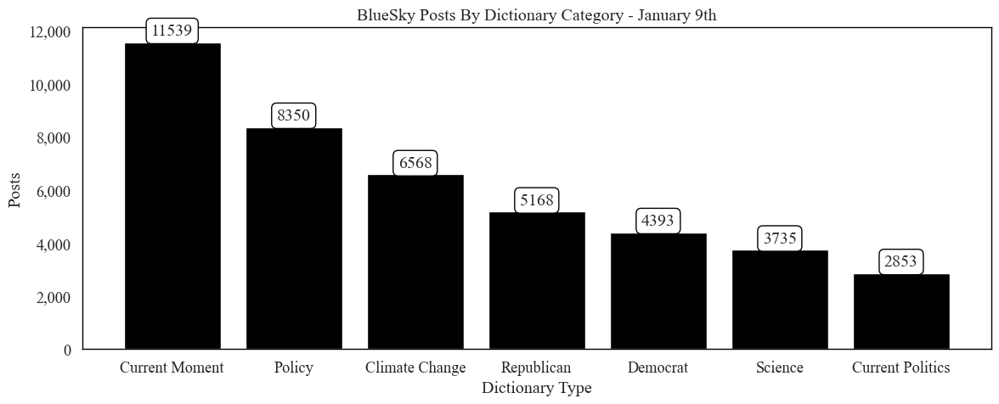

In [146]:
sb.set_style("white")
sb.set(font='Times New Roman', font_scale=1.2)
fig, ax = plt.subplots(figsize=(12,5 )) 



hist = sb.barplot(values,x="Dictionary",y="Total Frequency",color="black")


for bar_group in hist.containers:  # `containers` contains the histogram bars grouped by hue
    # Get heights and centers for each group
    heights = [bar.get_height() for bar in bar_group]
    centers = [bar.get_x() + bar.get_width() / 2 for bar in bar_group]
    
    # Add markers
    plt.scatter(centers, heights, color='black', zorder=3)
    
    for center, height in zip(centers, heights):
        plt.text(
            center, 
            height, 
            f'{int(height):,}',  # Format with commas
            color='black', 
            ha='center', 
            va='bottom', 
            fontsize=10
        )

for container in hist.containers:
    hist.bar_label(container, fmt='%d', label_type='edge', padding=3, bbox=dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="white"))

hist.set_title("BlueSky Posts By Dictionary Category - January 9th")
hist.set_xlabel("Dictionary Type")
hist.set_ylabel("Posts")
ax.tick_params(axis='x')
ax.grid(True)
ax.set_facecolor("white")

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax.yaxis.set_major_formatter(formatter)


# Set the border (box) around the entire plot
for spine in ax.spines.values():
    spine.set_edgecolor('black')  # Set the color of the border to black
    spine.set_linewidth(1)  # Set the width of the border

plt.tight_layout()
plt.savefig("Distribution of BlueSky Posts By Dictionary Category January 9th.png",dpi=2500)
plt.show();

## 6. Creating a Word Cloud

In [174]:
def topic_name_cleaner(name):
    split_name = re.sub("_"," ",name)
    clean_name = split_name.strip()
    return(clean_name)


In [175]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def create_wordcloud(model, topics,title):
    text = {}
    topic_names = []
    for topic in topics:
        current_text = {word: value for word, value in model.get_topic(topic)}
        text.update(current_text)
        
        ## Creating the caption
        current_topic = topic_model.get_topic_info(topic)
        current_name =  current_topic.at[0,'Name']
        
        cleaned_name = topic_name_cleaner(current_name)
        topic_names.append(cleaned_name)
        
    ## Plotting the word cloud
    wc = WordCloud(width=600, height=300,background_color="white", max_words=1000)
    wc.generate_from_frequencies(text)
    
    ## Generating the visualization
    plt.figure(figsize=(9, 5),dpi=1000)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    
    ## Making the title & caption
    plt.title(title, fontsize=12)
    
    '''caption = "Topics Visualized:\n"+topic_names[0]
    counter = 0  # Initialize a counter

    for topic in topic_names[1:]:
        if counter == 2:
            caption = caption+"\n"+topic
            counter = 0
        else:
            caption = caption+", "+topic
            counter = counter + 1'''
            
    #plt.figtext(0.5, caption 0.05, wrap=True, horizontalalignment='center', fontsize=8,)
    plt.savefig(title+".png")
    plt.show()
    

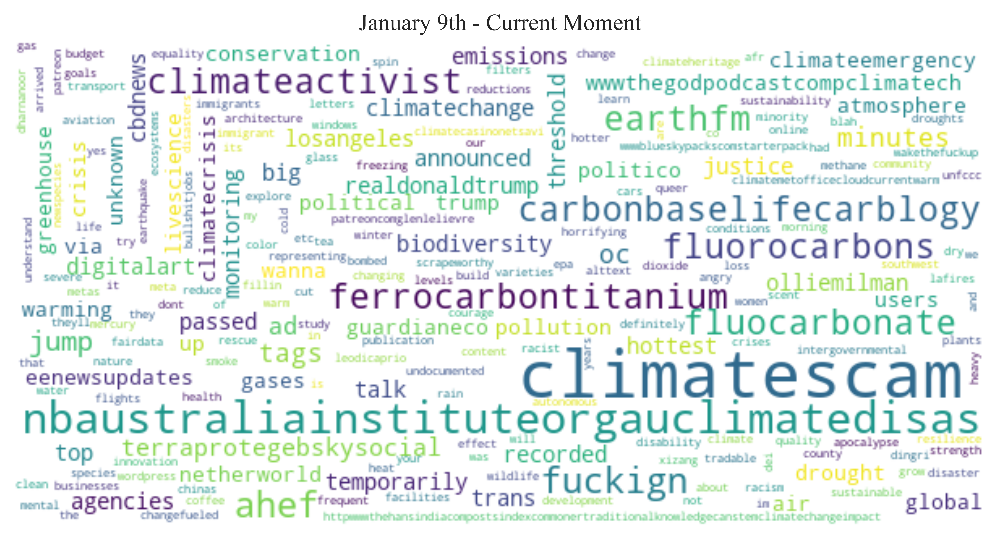

In [176]:
# Show wordcloud
create_wordcloud(topic_model,[257,2,8,264,10,11,18,275,22,151,24,155,38,169,49,181,56,60,209,85,87,224,125,-1],
                 'January 9th - Current Moment')

## 7. Saving the Model to HuggingFace

In [177]:
from huggingface_hub import login

In [179]:
topic_model.save("bsky-posts-9",serialization='pickle',save_embedding_model=True,save_ctfidf=True,)

2025-01-26 19:37:16,591 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.
C:\Users\natal\miniconda3\lib\site-packages\scipy\sparse\_index.py:146: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.



In [ ]:

# Push to HuggingFace Hub
topic_model.push_to_hf_hub(
    repo_id="nataliecastro/bsky-climate-posts",
    save_ctfidf=True,
    private=True,
    commit_message='Adding January 9th climate related posts',
    save_embedding_model=True,
)


## 8. Fitting the News Posts to the Current Model

In [195]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,30,-1_climatescam_nbaustraliainstituteorgauclimat...,"[climatescam, nbaustraliainstituteorgauclimate...",NaN
1,0,708,0_insurance_companies_risk_insurers,"[insurance, companies, risk, insurers, home, a...",NaN
2,1,877,1_fossil_fuel_fuels_oil,"[fossil, fuel, fuels, oil, industry, burning, ...",NaN
3,2,602,2_resilience_strength_mental_life,"[resilience, strength, mental, life, your, com...",NaN
4,3,490,3_ai_data_use_using,"[ai, data, use, using, tech, centers, energy, ...",NaN
...,...,...,...,...,...
285,284,21,284_answers_maga_number_endings,"[answers, maga, number, endings, easier, vile,...",NaN
286,285,32,285_dioxide_wyoming_carbon_law,"[dioxide, wyoming, carbon, law, wyofilecommake...",NaN
287,286,55,286_planet_fine_saving_our,"[planet, fine, saving, our, we, will, destroyi...",NaN
288,287,18,287_percentage_vitamin_earthhigh_seating,"[percentage, vitamin, earthhigh, seating, teen...",NaN


In [196]:
news[2]

'Human composting is rising in popularity as an earthfriendly life after death '

In [197]:
topics, similarity = topic_model.find_topics(news[2], top_n=1)

In [208]:
probable_news_topics = []
for headline in news:
    current_topic, similarity = topic_model.find_topics(headline,top_n=1)
    probable_news_topics.append(current_topic[0])

In [209]:
''' CREATING A DATAFRAME '''

news_topics = pd.DataFrame()
news_topics['Headline'] = news
news_topics['Topic'] = probable_news_topics

In [210]:
news_topics

,Headline,Topic
0,"i class=""cssqtgz""/ispan ariahidden=""true""@nytc...",179
1,Jurassic footprints unearthed on ‘dinosaur hi...,43
2,Human composting is rising in popularity as an...,221
3,The ‘world’s largest’ vacuum to suck climate p...,8
4,Can this oceanbased carbon plant help save the...,22
...,...,...
126,"source media=""(minwidth: px)"" srcset=""https://...",194
127,"svg class=""msqjlax snsfknj"" viewbox="" "" xmln...",94
128,Brazil reels from one of the worst droughts in...,10
129,From Trump to AI &amp; climate change: What do...,18


In [212]:
len(news_topics['Topic'].value_counts())

39

In [219]:
topic_names = topic_info[['Topic','Name']]

In [220]:
news_topics = news_topics.merge(right=topic_names,on='Topic')

In [221]:
news_topics

,Headline,Topic,Name
0,"i class=""cssqtgz""/ispan ariahidden=""true""@nytc...",179,179_insideclimatenewsorgnews_wwwclimategovnews...
1,Jurassic footprints unearthed on ‘dinosaur hi...,43,43_fossils_fossil_fossilized_old
2,Scientists discover millionyearold fossils,43,43_fossils_fossil_fossilized_old
3,Human composting is rising in popularity as an...,221,221_recycling_reuse_recycle_waste
4,The ‘world’s largest’ vacuum to suck climate p...,8,8_air_pollution_health_smoke
...,...,...,...
126,"svg class=""msqjlax snsfknj"" viewbox="" "" xmln...",94,94_det_er_som_av
127,"svg class=""msqjlax snsfknj"" viewbox="" "" xmln...",94,94_det_er_som_av
128,"div class=""promopremiumcontentlabelwrap""/divdi...",78,78_earthquakes_concrete_brick_zone
129,"div class=""ptitlespacer""Magnitude earthquake ...",78,78_earthquakes_concrete_brick_zone


In [224]:
values = news_topics['Name'].value_counts()

In [227]:
value_counts = pd.DataFrame(values)
value_counts['Percentage'] = value_counts['Name'] / 131

###### topics_by_dictionary

In [229]:
semantic_topics_nested

[[87, 60, 85, 256, 155],
 [60, 155, 87, 85, 11],
 [56, 72, 181, 218, 125],
 [56, 72, 181, 218, 125],
 [163, 212, 206, 219, 230],
 [163, 212, 206, 219, 158],
 [163, 212, 3, 219, 203],
 [163, 212, 206, 219, 149],
 [163, 212, 31, 3, 230],
 [212, 163, 283, 219, 206],
 [101, 19, 176, 163, 254],
 [101, 163, 212, 19, 219],
 [84, 0, 272, 185, 213],
 [211, 185, 84, 203, 147],
 [93, 4, 159, 88, 15],
 [41, 18, 86, 185, 203],
 [38, 257, 24, 2, 271],
 [84, 86, 236, 83, 220],
 [21, 136, 83, 236, 15],
 [21, 136, 83, 236, 15],
 [21, 136, 83, 15, 223],
 [21, 136, 83, 104, 147],
 [21, 136, 83, 104, 147],
 [93, 15, 284, 104, 151],
 [21, 83, 136, 236, 220],
 [21, 83, 136, 236, 263],
 [21, 136, 83, 275, 104],
 [21, 136, 83, 89, 122],
 [83, 21, 136, 6, 223],
 [2, 24, 38, 257, 49],
 [11, 169, 275, 87, 224],
 [60, 49, 155, 56, -1],
 [49, 18, 8, 22, 125],
 [60, 155, 56, 87, 125],
 [60, 155, 85, 10, 87],
 [49, 22, 8, 18, 125],
 [209, 264, 181, 155, 151],
 [89, 250, 270, 185, 147],
 [4, 20, 69, 23, 159],
 [188, 

In [230]:
climate_words

['global warming',
 'climate change',
 'greenhouse gas',
 'greenhouse gases',
 'scientist',
 'scientists',
 'research',
 'researchers',
 'researching',
 'researched',
 'professor',
 'professors',
 'policy',
 'legislation',
 'FEMA',
 'management',
 'disaster respons',
 'government',
 'republican',
 'republicans',
 'GOP',
 'conservative',
 'conservatives',
 'MAGA',
 'democrat',
 'democrats',
 'liberal',
 'liberals',
 'DNC',
 'resilience',
 'just transition',
 'climate justice',
 'environmental justice',
 'climate activism',
 'climate anxiety',
 'environmental racism',
 'ecoside',
 'insurrection',
 'wildfires',
 'inaguration']

In [233]:
semantic_topics_nested

[[87, 60, 85, 256, 155],
 [60, 155, 87, 85, 11],
 [56, 72, 181, 218, 125],
 [56, 72, 181, 218, 125],
 [163, 212, 206, 219, 230],
 [163, 212, 206, 219, 158],
 [163, 212, 3, 219, 203],
 [163, 212, 206, 219, 149],
 [163, 212, 31, 3, 230],
 [212, 163, 283, 219, 206],
 [101, 19, 176, 163, 254],
 [101, 163, 212, 19, 219],
 [84, 0, 272, 185, 213],
 [211, 185, 84, 203, 147],
 [93, 4, 159, 88, 15],
 [41, 18, 86, 185, 203],
 [38, 257, 24, 2, 271],
 [84, 86, 236, 83, 220],
 [21, 136, 83, 236, 15],
 [21, 136, 83, 236, 15],
 [21, 136, 83, 15, 223],
 [21, 136, 83, 104, 147],
 [21, 136, 83, 104, 147],
 [93, 15, 284, 104, 151],
 [21, 83, 136, 236, 220],
 [21, 83, 136, 236, 263],
 [21, 136, 83, 275, 104],
 [21, 136, 83, 89, 122],
 [83, 21, 136, 6, 223],
 [2, 24, 38, 257, 49],
 [11, 169, 275, 87, 224],
 [60, 49, 155, 56, -1],
 [49, 18, 8, 22, 125],
 [60, 155, 56, 87, 125],
 [60, 155, 85, 10, 87],
 [49, 22, 8, 18, 125],
 [209, 264, 181, 155, 151],
 [89, 250, 270, 185, 147],
 [4, 20, 69, 23, 159],
 [188, 

In [234]:
test = pd.DataFrame()
test['word'] = climate_words
test['Topic'] = semantic_topics_nested

In [238]:
exploded = test.explode('Topic')

In [243]:
cond = exploded['Topic'] == 10
exploded[cond]

,word,Topic
34,climate anxiety,10
